In [1]:
import cv2 
import numpy as np 
import matplotlib.pyplot as plt 
plt.rcParams["figure.autolayout"] = True

In [2]:
img = cv2.imread('photo2.PNG')

(-0.5, 400.5, 373.5, -0.5)

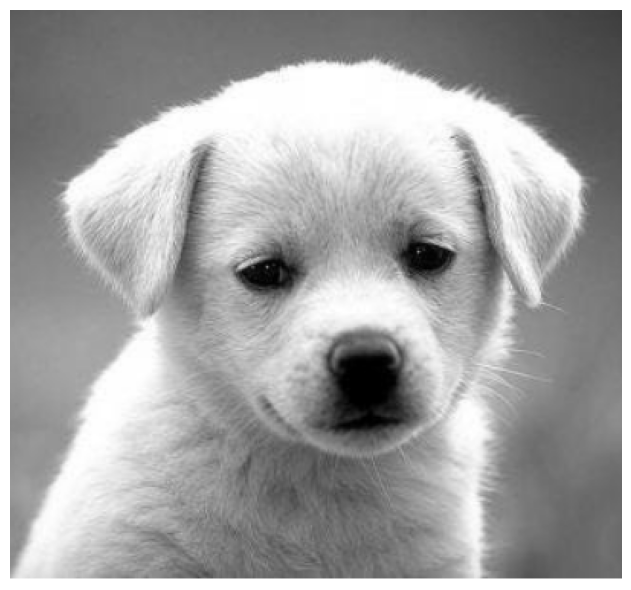

In [3]:
plt.figure(figsize = (12,6))
plt.imshow(img)
plt.axis('off')

In [4]:
def gammaTransformation(r, gamma, c=1):
    s = c* (r**gamma)
    return s 

# Gamma < 1

In [5]:
def scale_image(input_img):
    input_img = input_img / np.max(input_img)
    input_img = (input_img*255).astype('int')
    return input_img

In [6]:
img_gamma = gammaTransformation(img, 0.4)
img_gamma_scaled = scale_image(img_gamma)

In [7]:
def plot_results(input_img, output_img, x_values, y_values, save_as):

    # plotting the graph
    plt.figure(figsize = (36,12))

    plt.subplot(131)
    plt.imshow(input_img)
    plt.title('Input Image')
    plt.axis('off')

    plt.subplot(132)
    plt.plot(x_values, y_values)
    plt.xlabel('Input Pixels')
    plt.ylabel('Output Pixels')
    plt.grid(True)

    plt.subplot(133)
    plt.imshow(output_img)
    plt.title('Transformed Image')
    plt.axis('off')

    plt.savefig(save_as + '.png')

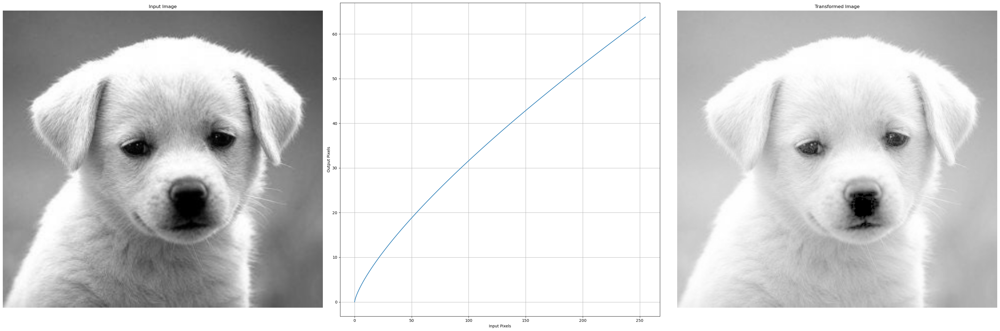

In [8]:
x_values = np.linspace(0,255,500)
y_values = gammaTransformation(x_values, 0.75)

plot_results(img, img_gamma_scaled, x_values, y_values, 'gamma_0.75')

In [9]:
def performGammaTransformation(input_img, gammaValue):
        img_gamma = gammaTransformation(input_img, gammaValue)
        img_gamma_scaled = scale_image(img_gamma)
        
        x_values = np.linspace(0,255,500)
        y_values = gammaTransformation(x_values, gammaValue)
        
        plot_results(input_img,img_gamma_scaled, x_values, y_values,"gamma" + str(gammaValue))   
        
        return img_gamma_scaled

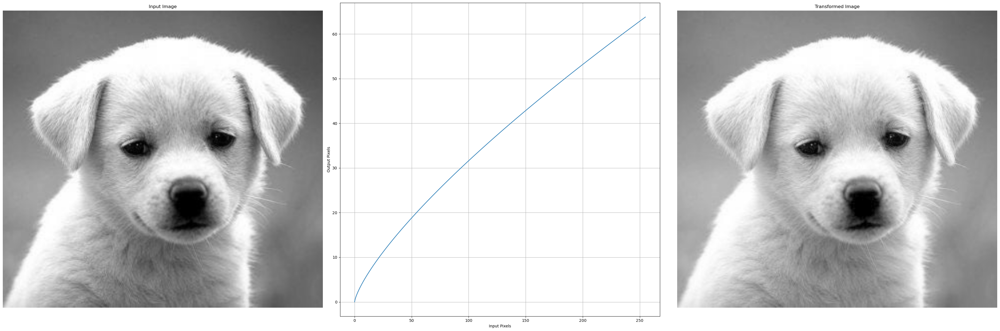

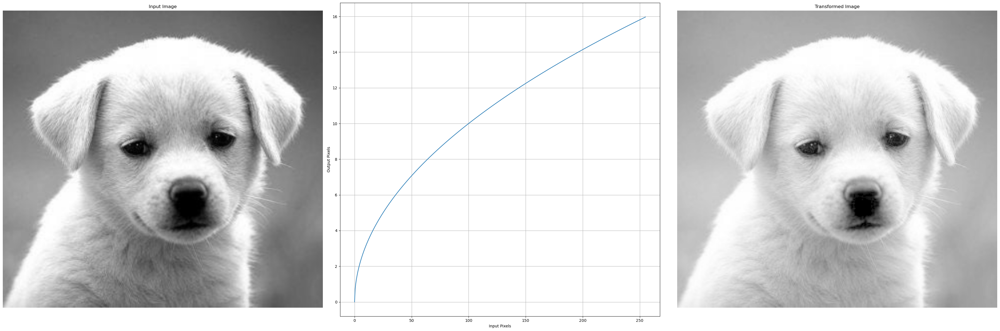

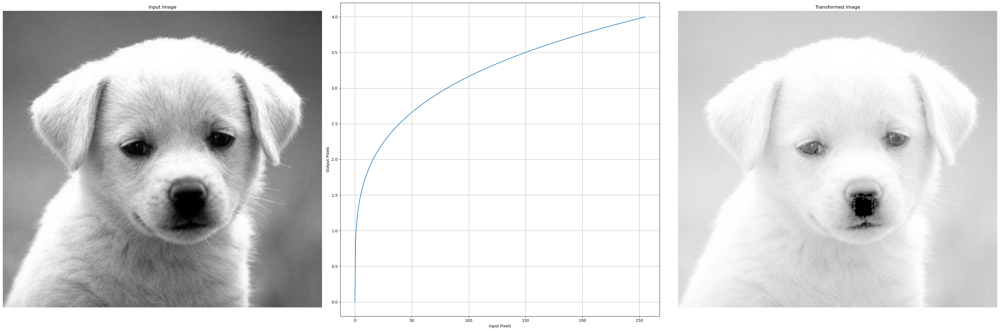

In [10]:
final_images = []

for gammaValue in [0.75, 0.50, 0.25]:
    final_images.append(performGammaTransformation(img, gammaValue))

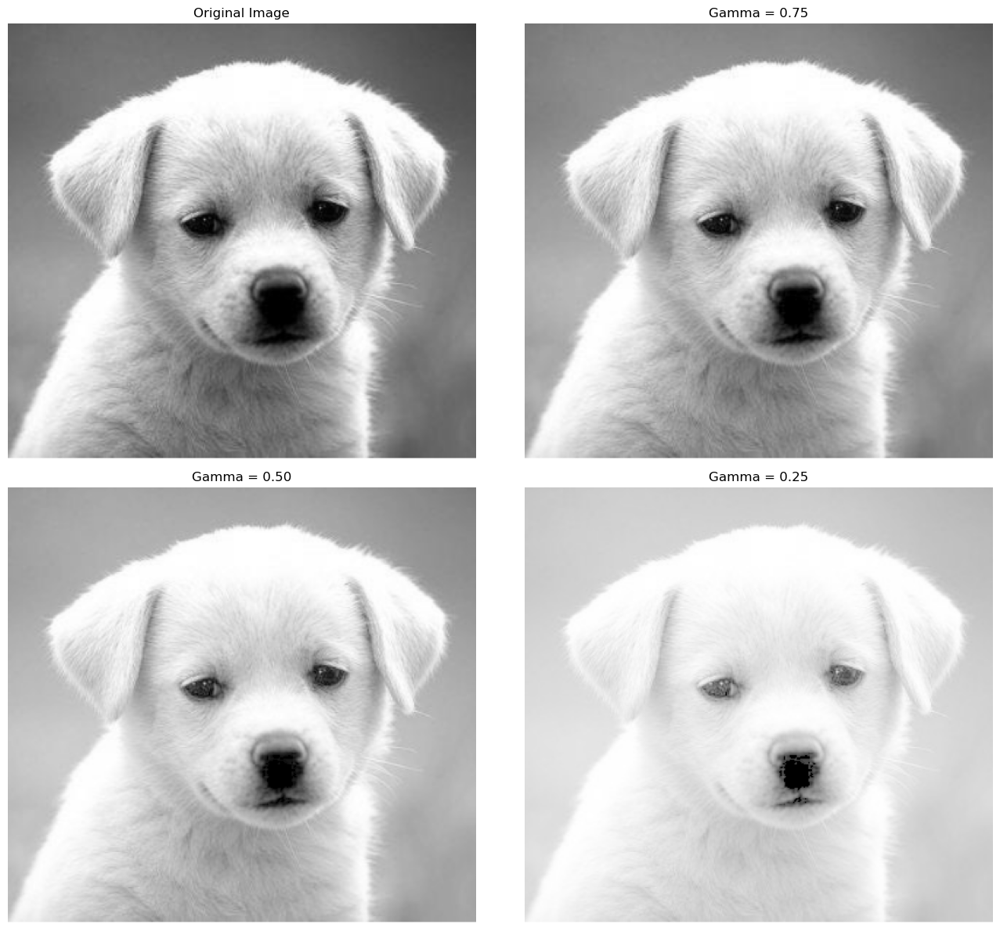

In [11]:
plt.figure(figsize = (24,12))

plt.subplot(221)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(222)
plt.imshow(final_images[0])
plt.title('Gamma = 0.75')
plt.axis('off')

plt.subplot(223)
plt.imshow(final_images[1])
plt.title("Gamma = 0.50")
plt.axis('off')

plt.subplot(224)
plt.imshow(final_images[2])
plt.title("Gamma = 0.25")
plt.axis('off')

plt.tight_layout()
plt.savefig('gamma.png')

# Gamma > 1

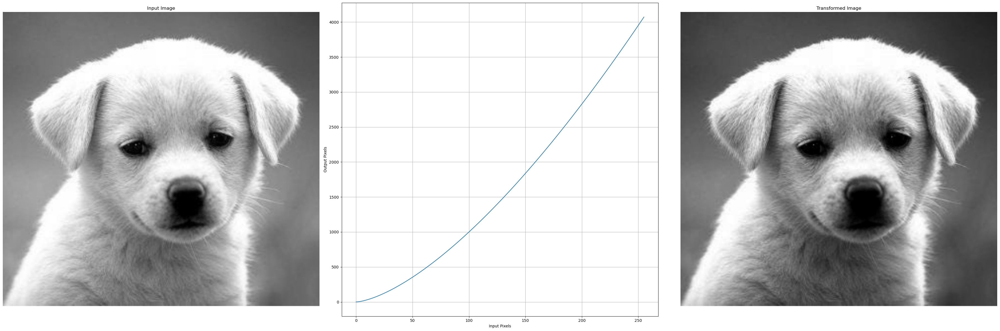

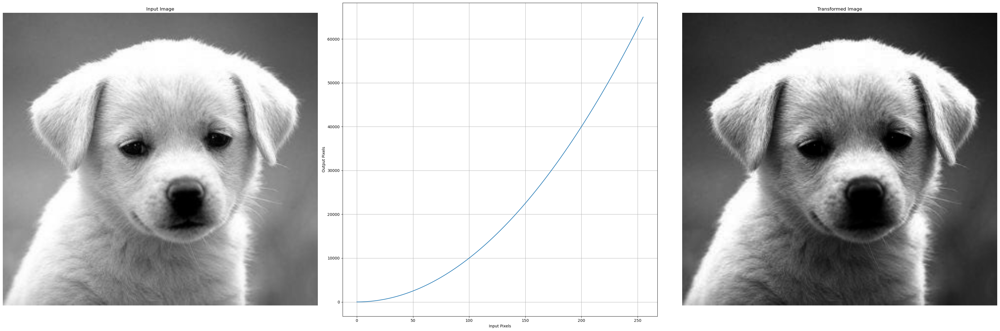

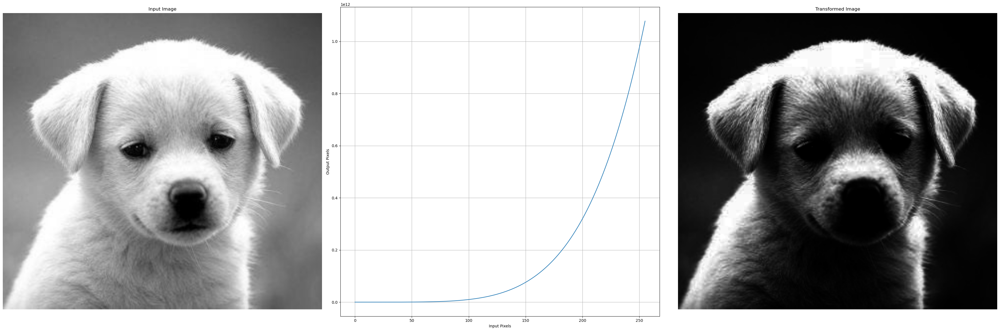

In [12]:
final_images_large = []

for gammaValue in [1.5, 2.0, 5.0]:
    final_images_large.append(performGammaTransformation(img, gammaValue))

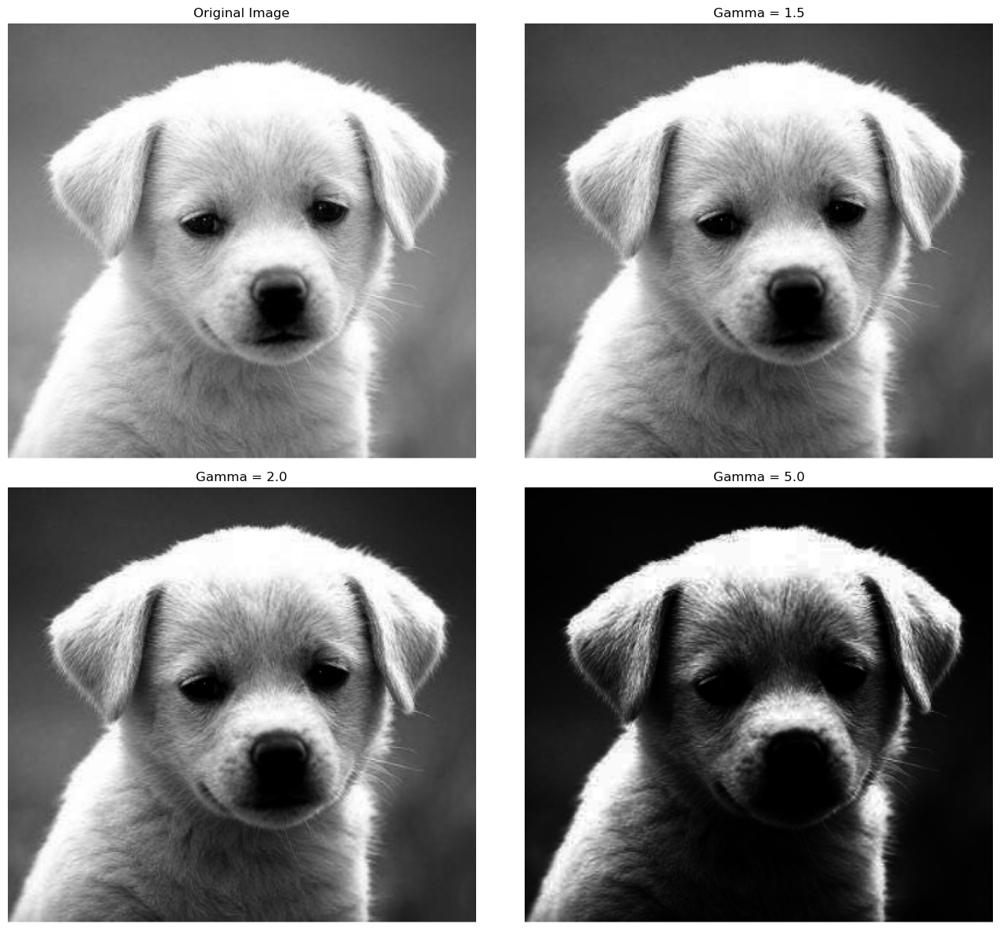

In [13]:
plt.figure(figsize = (24,12))

plt.subplot(221)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(222)
plt.imshow(final_images_large[0])
plt.title('Gamma = 1.5')
plt.axis('off')

plt.subplot(223)
plt.imshow(final_images_large[1])
plt.title("Gamma = 2.0")
plt.axis('off')

plt.subplot(224)
plt.imshow(final_images_large[2])
plt.title("Gamma = 5.0")
plt.axis('off')

plt.tight_layout()
plt.savefig('gamma_large.png')